<span style="font-size: 6px; float:right">Notebook created by Mateusz Guzik<a style="text-decoration: none; color:#000;"></a></span>
<br>
<center><font size="6"><b>Digital Signal Processing Lab</b></font></center>
<br />
<center><font size="5"><b><u>Filters with audio and images</u></b></font></center>

My name is Mariusz Więcławek.
If you have collaborated with other peers while working on this notebook, please annouce theirs names below.
- Michał Woźniak
- Adrian Kortyla
- Michał Hasior

# Introducion

Digital filters are one of the basic tools used for music production, compression, telecommunication, image processing and multiple other signal processing applications. Within this notebook you will experiment with digital filtering on both audio and images.

## Reading list

Before working with the notebook, you might find it useful to become acquainted with the following materials:
- <span style="font-size: 12px">Section **9.7 Dwuwymiarowa dyskretna transformacja Fouriera** from “Cyfrowe przetwarzanie sygnałów : od teorii do zastosowań, WKŁ 2014” by T. P. Zieliński.</span>
- <span style="font-size: 12px">Section **22.1. Wprowadzenie do świata 2D i 3D** from “Cyfrowe przetwarzanie sygnałów : od teorii do zastosowań, WKŁ 2014” by T. P. Zieliński.</span>
- <span style="font-size: 12px">Section **22.2.Transformacje ortogonalne 2D obrazów** from “Cyfrowe przetwarzanie sygnałów : od teorii do zastosowań, WKŁ 2014” by T. P. Zieliński.</span>
- <span style="font-size: 12px">Section **22.3.  Filtracja 2D obrazów** from “Cyfrowe przetwarzanie sygnałów : od teorii do zastosowań, WKŁ 2014” by T. P. Zieliński.</span>

## Notebook setup

In [2]:
import numpy as np
from scipy.io.wavfile import read, write
import scipy.signal
import matplotlib.pyplot as plt
from pathlib import Path
import requests
from tqdm import tqdm
import IPython.display as ipd

In [3]:
def download(url, path):
    if not isinstance(path, Path):
        path = Path(path)
    if not path.is_file():
        r = requests.get(url)
        with open(path, "wb") as f:
            f.write(r.content)
            
urls = {
    "epic_sax_guy_single_channel.wav": "http://sp-class.agh.edu.pl/samples/epic_sax_guy_single_channel.wav",
    "lenna.png": "http://sp-class.agh.edu.pl/samples/lenna.png",
}

for filename, url in tqdm(urls.items()):
    download(url, filename)

100%|██████████| 2/2 [00:00<00:00, 4332.96it/s]


# Filters with audio

## FIR filters
Design 4 FIR filters, each being of a different type, such that there is one low-pass, one band-pass, one band-stop and one high-pass. Their cutoff frequencies are denoted by `f_LP`, `f_BPL` and `f_BPH`, `f_BSL` and `f_BSH`, `f_HP`, respectively. Place the impulse responses in corresponding variables called `h_LP`, `h_BP`, `h_BS` and `h_HP`.

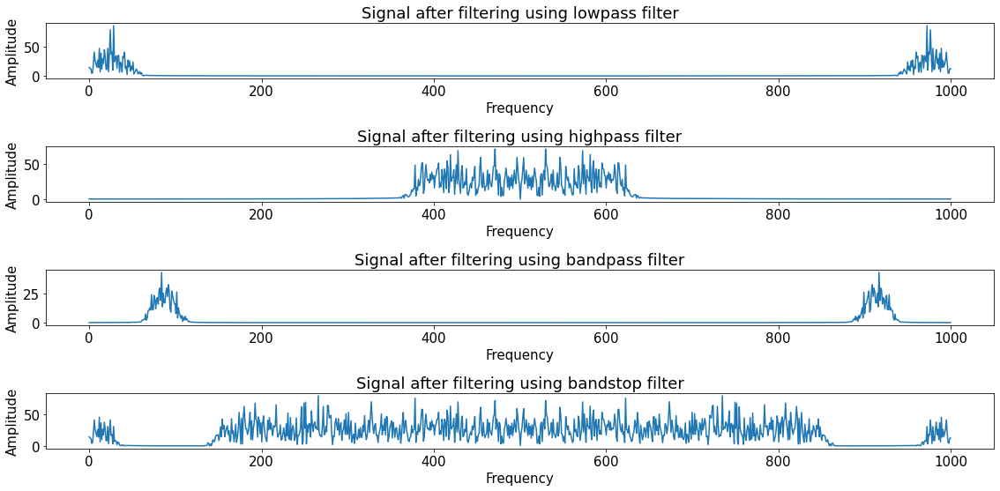

In [107]:
f_LP = 0.1

f_BPL = 0.15
f_BPH = 0.2

f_BSL = 0.05
f_BSH = 0.3

f_HP = 0.75

N = 89 # Number of coefficients

fs = 1000  # Sampling frequency
dt = 1/fs # Sampling interval
t_s = 0   # Start of sampling 
t_s = 1   # End of sampling 

# Generate timestamps of samples
t = np.arange(0, 1, dt)

# Generate white noise signal
signal = np.random.randn(*t.shape)

# Designing filters
h_LP = scipy.signal.firwin(N, f_LP, pass_zero='lowpass') # lowpass
h_HP = scipy.signal.firwin(N, f_HP, pass_zero='highpass') #highpass
h_BP = scipy.signal.firwin(N, [f_BPL, f_BPH], pass_zero='bandpass') # bandpass
h_BS = scipy.signal.firwin(N, [f_BSL, f_BSH], pass_zero='bandstop') # bandstop

# Signal filtering
filtered_LP = np.convolve(signal, h_LP)
filtered_HP = np.convolve(signal, h_HP)
filtered_BP = np.convolve(signal, h_BP)
filtered_BS = np.convolve(signal, h_BS)

# Plot characteristics
plt.figure(figsize = (16,8))
plt.subplot(4,1,1)
plt.plot(np.linspace(0,fs,1024), np.abs(np.fft.fft(filtered_LP,1024)))
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using lowpass filter')

plt.subplot(4,1,2)
plt.plot(np.linspace(0,fs,1024), np.abs(np.fft.fft(filtered_HP,1024)))
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using highpass filter')

plt.subplot(4,1,3)
plt.plot(np.linspace(0,fs,1024), np.abs(np.fft.fft(filtered_BP,1024)))
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using bandpass filter')

plt.subplot(4,1,4)
plt.plot(np.linspace(0,fs,1024), np.abs(np.fft.fft(filtered_BS,1024)))
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using bandstop filter')

plt.tight_layout()
plt.show()

### Verify your implementation
Look at the frequency responses in the cell below and check if your filters are implemented correctly. Then, look at and listen to the original and filtered signals. Try different cutoff frequencies and filter lengths and look at the results. Note that some frequencies might not be audible on low quality speakers.

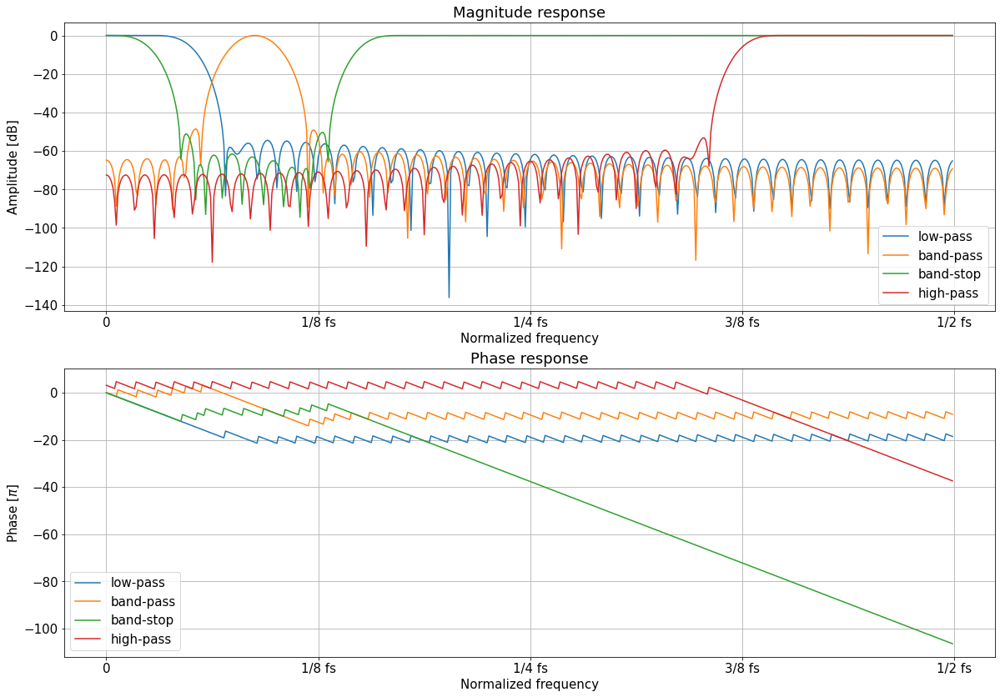

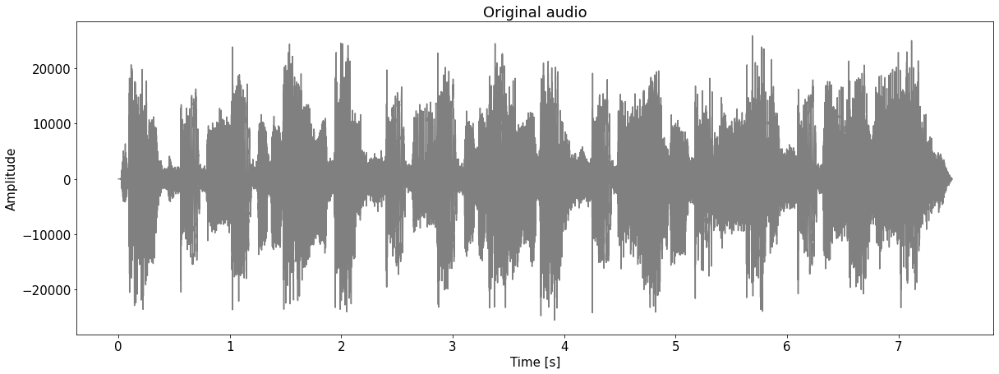

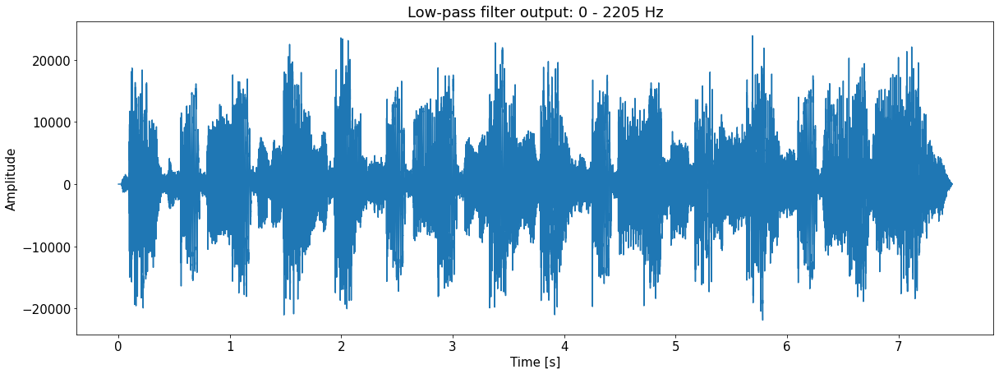

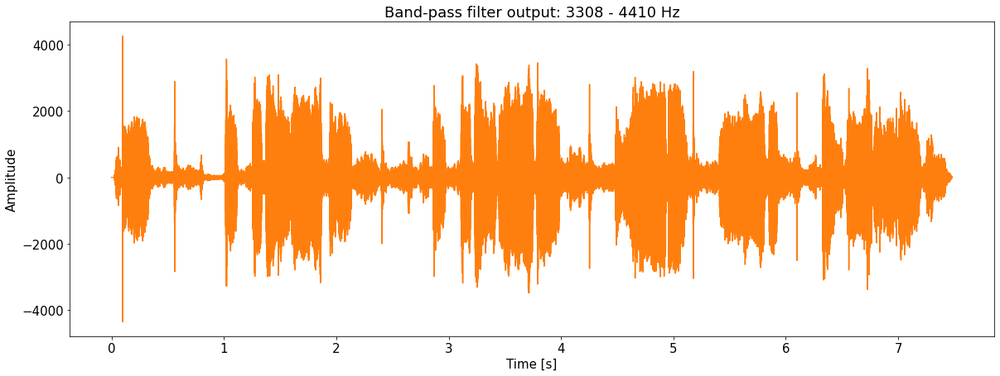

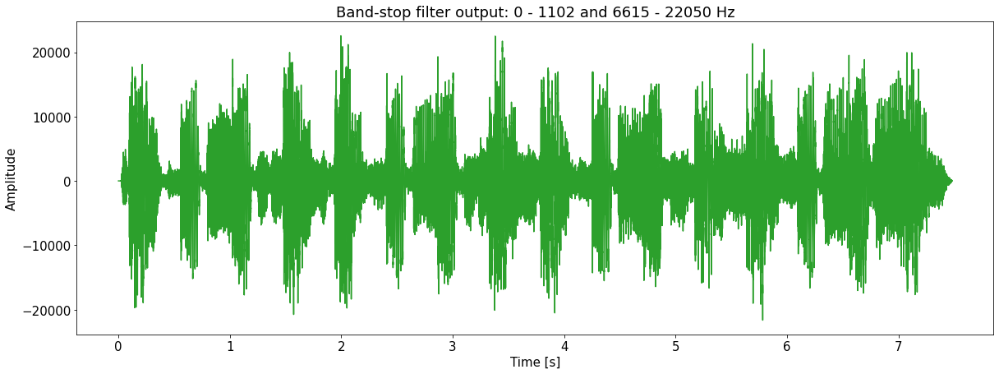

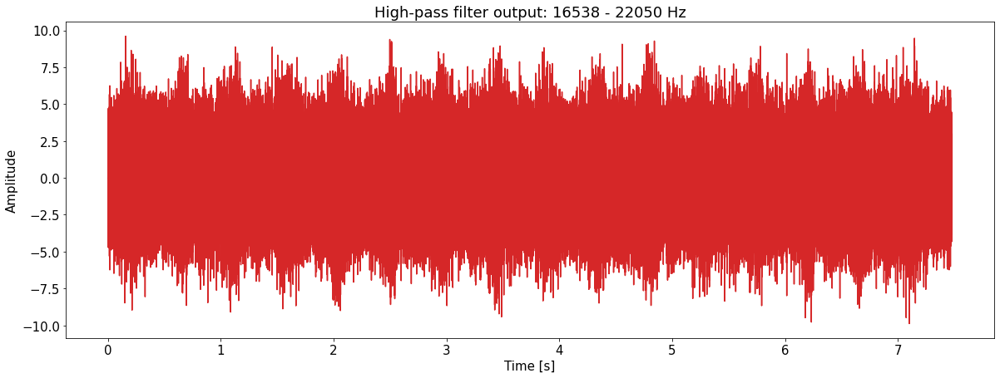

In [108]:
w_LP, H_LP = scipy.signal.freqz(h_LP)
angles_LP = np.unwrap(np.angle(H_LP))

w_BP, H_BP = scipy.signal.freqz(h_BP)
angles_BP = np.unwrap(np.angle(H_BP))

w_BS, H_BS = scipy.signal.freqz(h_BS)
angles_BS = np.unwrap(np.angle(H_BS))

w_HP, H_HP = scipy.signal.freqz(h_HP)
angles_HP = np.unwrap(np.angle(H_HP))


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 1, figsize=(20, 14))

ax[0].plot(20*np.log10(np.abs(H_LP)), label='low-pass')
ax[0].plot(20*np.log10(np.abs(H_BP)), label='band-pass')
ax[0].plot(20*np.log10(np.abs(H_BS)), label='band-stop')
ax[0].plot(20*np.log10(np.abs(H_HP)), label='high-pass')
ax[0].set_title('Magnitude response')
ax[0].set_xlabel('Normalized frequency')
ax[0].set_ylabel('Amplitude [dB]')
ax[0].set_xticks([0, len(H_LP)/4, len(H_LP)/2, 3*len(H_LP)/4, len(H_LP)])
ax[0].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[0].grid()
ax[0].legend()

ax[1].plot(angles_LP, label='low-pass')
ax[1].plot(angles_BP, label='band-pass')
ax[1].plot(angles_BS, label='band-stop')
ax[1].plot(angles_HP, label='high-pass')
ax[1].set_title('Phase response')
ax[1].set_xlabel('Normalized frequency')
ax[1].set_ylabel('Phase [$\pi$]')
ax[1].set_xticks([0, len(H_LP)/4, len(H_LP)/2, 3*len(H_LP)/4, len(H_LP)])
ax[1].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[1].grid()
ax[1].legend()

fig.show()


fs, x = read('epic_sax_guy_single_channel.wav')  # this is a single-channel version

y_LP = scipy.signal.lfilter(h_LP, 1, x)
y_BP = scipy.signal.lfilter(h_BP, 1, x)
y_BS = scipy.signal.lfilter(h_BS, 1, x)
y_HP = scipy.signal.lfilter(h_HP, 1, x)


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(x))*1/fs, x, color=(0.5, 0.5, 0.5))
plt.title('Original audio')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=x, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_LP))*1/fs, y_LP, 'C0')
plt.title('Low-pass filter output: 0 - ' + str(round(fs/2*f_LP)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_LP, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_BP))*1/fs, y_BP, 'C1')
plt.title('Band-pass filter output: ' + str(round(fs/2*f_BPL)) + ' - ' + str(round(fs/2*f_BPH)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_BP, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_BS))*1/fs, y_BS, 'C2')
plt.title('Band-stop filter output: 0 - ' + str(round(fs/2*f_BSL)) + ' and ' + str(round(fs/2*f_BSH)) + 
      ' - ' + str(round(fs/2)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_BS, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_HP))*1/fs, y_HP, 'C3')
plt.title('High-pass filter output: ' + str(round(fs/2*f_HP)) + ' - ' + str(round(fs/2)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_HP, rate=fs))

## IIR filters
Similarly to the previous task, design 4 IIR filters, each being of a different type, such that there is one low-pass, one band-pass, one band-stop and one high-pass. Their cutoff frequencies are denoted by `f_LP`, `f_BPL` and `f_BPH`, `f_BSL` and `f_BSH`, `f_HP`, respectively. Place the impulse responses in corresponding variables called `h_LP`, `h_BP`, `h_BS` and `h_HP`.

### Verify your implementation
Again, look at the frequency responses and listen to the filtered audio. Try different cutoff frequencies and filter lengths.

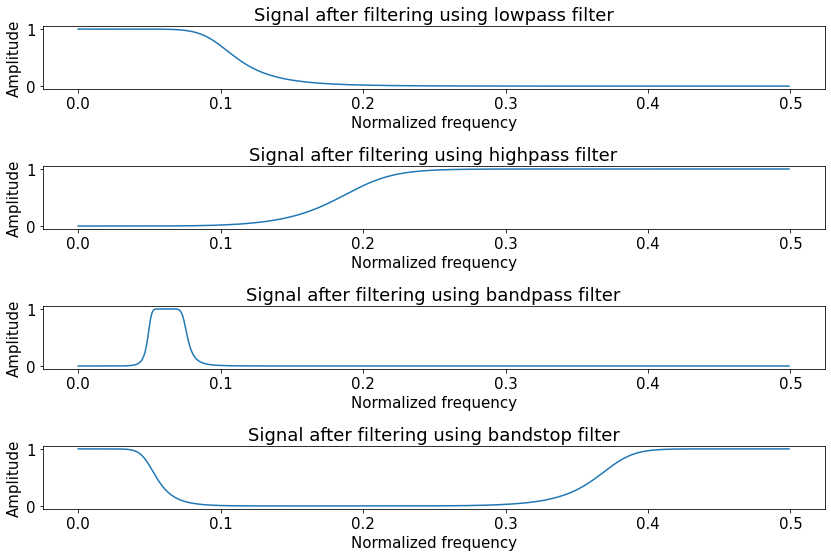

In [113]:
f_LP = 0.2

f_BPL = 0.1
f_BPH = 0.15

f_BSL = 0.1
f_BSH = 0.75

f_HP = 0.4

"Your code goes below here."
N = 5 # Number of coefficients

fs = 1000  # Sampling frequency
dt = 1/fs # Sampling interval
t_s = 0   # Start of sampling 
t_s = 1   # End of sampling 

# Generate timestamps of samples
t = np.arange(0, 1, dt)

# Generate white noise signal
signal = np.random.randn(*t.shape)

# Designing filters
b_LP, a_LP = scipy.signal.iirfilter(N, f_LP, btype='lowpass')
w_LP, h_LP = scipy.signal.freqz(b_LP, a_LP)

b_HP, a_HP = scipy.signal.iirfilter(N, f_HP, btype='highpass')
w, h_HP = scipy.signal.freqz(b_HP, a_HP)

b_BP, a_BP = scipy.signal.iirfilter(N, [f_BPL, f_BPH], btype='bandpass')
w, h_BP = scipy.signal.freqz(b_BP, a_BP)

b_BS, a_BS = scipy.signal.iirfilter(N, [f_BSL, f_BSH], btype='bandstop')
w, h_BS = scipy.signal.freqz(b_BS, a_BS)

# Signal filtering
filtered_LP = np.convolve(signal, h_LP)
filtered_HP = np.convolve(signal, h_HP)
filtered_BP = np.convolve(signal, h_BP)
filtered_BS = np.convolve(signal, h_BS)

# Plot characteristics
plt.figure(figsize = (12,8))

plt.subplot(4,1,1)
plt.plot(w_LP/np.pi/2, np.abs(h_LP))
plt.xlabel('Normalized frequency' )
plt.ylabel('Amplitude')
plt.title('Signal after filtering using lowpass filter')

plt.subplot(4,1,2)
plt.plot(w_HP/np.pi/2, np.abs(h_HP))
plt.xlabel('Normalized frequency' )
plt.ylabel('Amplitude')
plt.title('Signal after filtering using highpass filter')

plt.subplot(4,1,3)
plt.plot(w_BP/np.pi/2, np.abs(h_BP))
plt.xlabel('Normalized frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using bandpass filter')

plt.subplot(4,1,4)
plt.plot(w_BS/np.pi/2, np.abs(h_BS))
plt.xlabel('Normalized frequency')
plt.ylabel('Amplitude')
plt.title('Signal after filtering using bandstop filter')

plt.tight_layout()
plt.show()

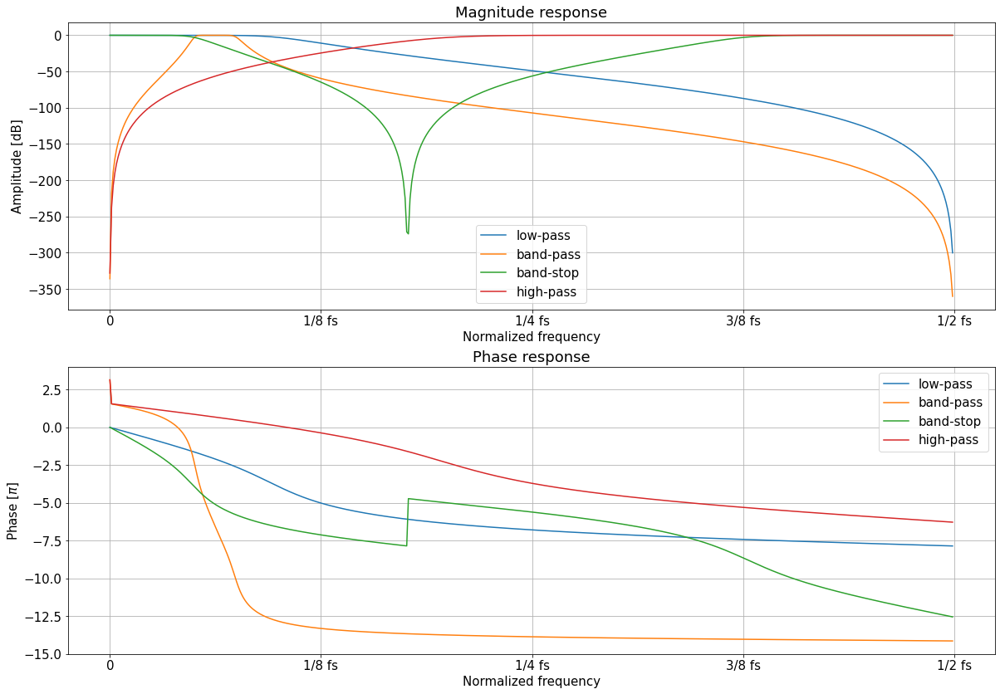

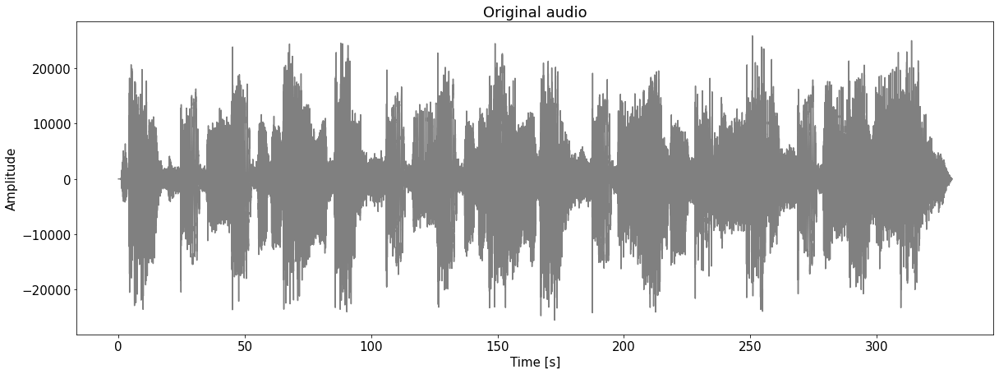

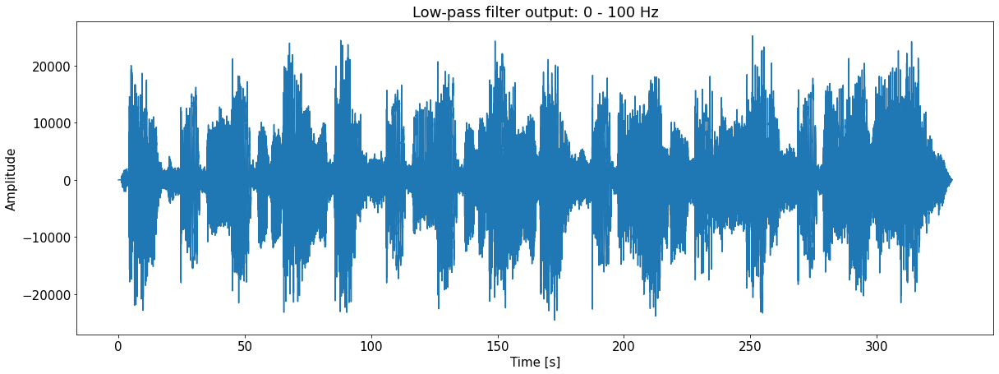

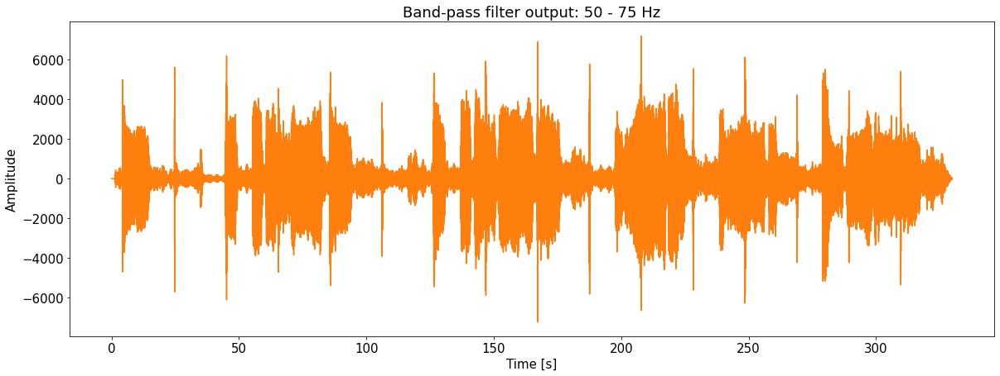

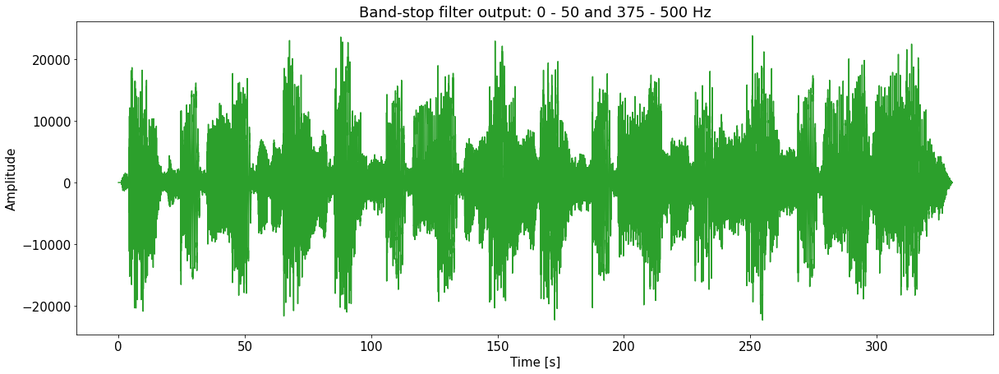

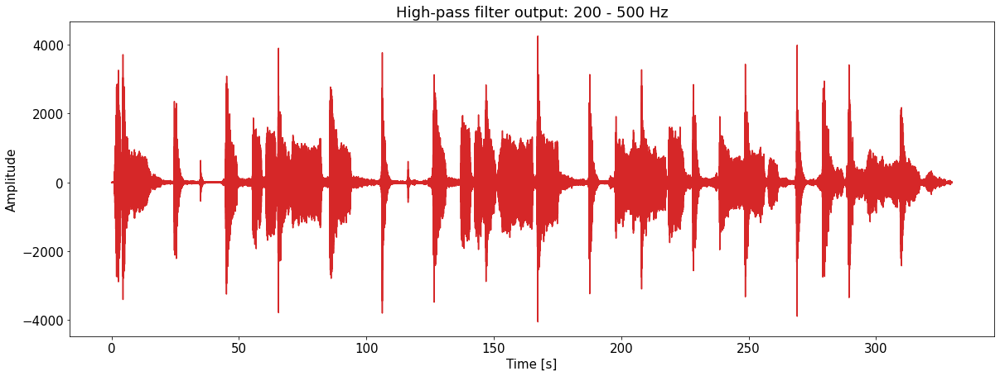

In [114]:
w_LP, H_LP = scipy.signal.freqz(b_LP, a_LP)
angles_LP = np.unwrap(np.angle(H_LP))

w_BP, H_BP = scipy.signal.freqz(b_BP, a_BP)
angles_BP = np.unwrap(np.angle(H_BP))

w_BS, H_BS = scipy.signal.freqz(b_BS, a_BS)
angles_BS = np.unwrap(np.angle(H_BS))

w_HP, H_HP = scipy.signal.freqz(b_HP, a_HP)
angles_HP = np.unwrap(np.angle(H_HP))


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 1, figsize=(20, 14))

ax[0].plot(20*np.log10(np.abs(H_LP)), label='low-pass')
ax[0].plot(20*np.log10(np.abs(H_BP)), label='band-pass')
ax[0].plot(20*np.log10(np.abs(H_BS)), label='band-stop')
ax[0].plot(20*np.log10(np.abs(H_HP)), label='high-pass')
ax[0].set_title('Magnitude response')
ax[0].set_xlabel('Normalized frequency')
ax[0].set_ylabel('Amplitude [dB]')
ax[0].set_xticks([0, len(H_LP)/4, len(H_LP)/2, 3*len(H_LP)/4, len(H_LP)])
ax[0].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[0].grid()
ax[0].legend()

ax[1].plot(angles_LP, label='low-pass')
ax[1].plot(angles_BP, label='band-pass')
ax[1].plot(angles_BS, label='band-stop')
ax[1].plot(angles_HP, label='high-pass')
ax[1].set_title('Phase response')
ax[1].set_xlabel('Normalized frequency')
ax[1].set_ylabel('Phase [$\pi$]')
ax[1].set_xticks([0, len(H_LP)/4, len(H_LP)/2, 3*len(H_LP)/4, len(H_LP)])
ax[1].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[1].grid()
ax[1].legend()

fig.show()


y_LP = scipy.signal.lfilter(b_LP, a_LP, x)
y_BP = scipy.signal.lfilter(b_BP, a_BP, x)
y_BS = scipy.signal.lfilter(b_BS, a_BS, x)
y_HP = scipy.signal.lfilter(b_HP, a_HP, x)


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(x))*1/fs, x, color=(0.5, 0.5, 0.5))
plt.title('Original audio')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=x, rate=fs))

plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_LP))*1/fs, y_LP, 'C0')
plt.title('Low-pass filter output: 0 - ' + str(round(fs/2*f_LP)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_LP, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_BP))*1/fs, y_BP, 'C1')
plt.title('Band-pass filter output: ' + str(round(fs/2*f_BPL)) + ' - ' + str(round(fs/2*f_BPH)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_BP, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_BS))*1/fs, y_BS, 'C2')
plt.title('Band-stop filter output: 0 - ' + str(round(fs/2*f_BSL)) + ' and ' + str(round(fs/2*f_BSH)) + 
      ' - ' + str(round(fs/2)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_BS, rate=fs))


plt.rc('font', size=15)

plt.figure(figsize=(20, 7))

plt.plot(np.arange(0, len(y_HP))*1/fs, y_HP, 'C3')
plt.title('High-pass filter output: ' + str(round(fs/2*f_HP)) + ' - ' + str(round(fs/2)) + ' Hz')
plt.ylabel('Amplitude')
plt.xlabel('Time [s]')
plt.show()
display(ipd.Audio(data=y_HP, rate=fs))

**Question**: What happens when the filter is too long?

**Answer**: Z racji, iż filtry typu IIR są filtrami o nieskończonej odpowiedzi impulsowej, jeżeli nasz filtr bedzie posiadał zbyt dużą liczbę współczynników jest możliwość, że utraci on swoją stabilność. Jeżeli filtr jest niestabilny początkowo posiada on założoną charakterystyke, jednak po jakimś czasie amplituda impulsu będzie się wzbudzać do bardzo dużych wartości. W tym momencie amplituda naszego sygnału dźwiękowego urosła by do bardzo dużych wartości przez co nie byłby on prawidłowo przefiltrowany.

Before moving to the second part of the notebook let's clear some memory.

In [148]:
%reset -f array

# Filters with images

## Filtering image with two 1D filters
If we want to filter the image, we need to consider that it is a 2D function. One way to do it is to filter the directions of X and Y axis separately. Design a FIR filter (e.g. low-pass), place it's impulse response in a variable called `h` and save the filter length in `N_h`. Convolve the impulse response with the image stored in `img` along X axis (rows) and place the result in `y_X`, then repeat it for the Y axis (columns) of `y_X` and place the result in `y_XY`. In the case of image processing the filter should be significantly shorter compared to audio applications (11 is a good starting point for this task). Try different types of filter, cutoff frequencies and filter lengths.

In [91]:
img = plt.imread('lenna.png')[..., 1] # we are going to work on one layer of the RGB image

"Your code goes below here."
N_h = 11
fc = 0.1
h = scipy.signal.firwin(N_h, fc, pass_zero = 'highpass')
x_image, y_image = img.shape

#rozmiar splotu po osi X
y_X = np.zeros((x_image , N_h + y_image -1))

#splot wzdłuż osi X
for i in range (y_image):
    y_X[i, :] = np.convolve(h, img[i, :])
    
#rozmiar splotu po osi X i Y
y_XY = np.zeros((N_h + x_image - 1, N_h + y_image -1))

#splot obrazu po osi x splatamy wzdłuż osi y
for i in range (x_image):
    y_XY[: , i] = np.convolve(h, y_X[: , i])

### Verify your implementation
The filter frequency responses and the filtered images are shown in the next cell.

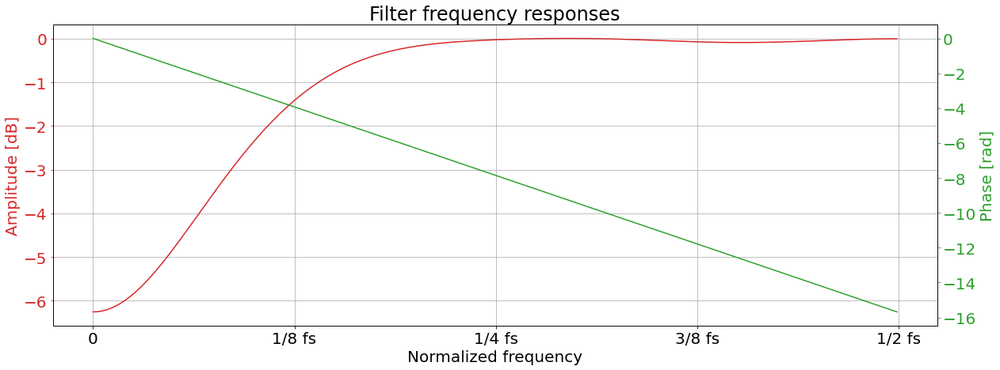

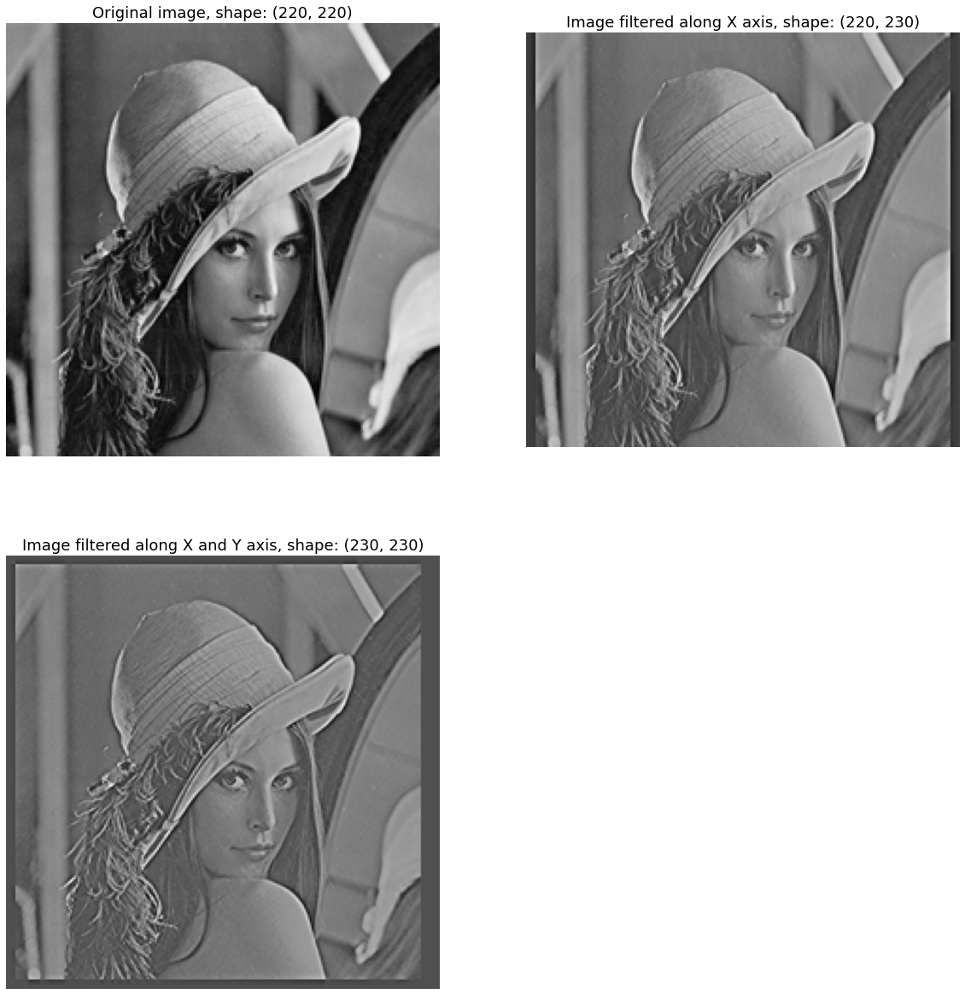

In [92]:
w, H = scipy.signal.freqz(h)
angles = np.unwrap(np.angle(H))


plt.rc('font', size=20)

fig, ax = plt.subplots(figsize=(20, 7))

ax.plot(20*np.log10(abs(H)), 'C3')
ax.grid()
ax.set_title('Filter frequency responses')
ax.set_xlabel('Normalized frequency')
ax.set_ylabel('Amplitude [dB]', color='C3')
ax.set_xticks([0, len(H)/4, len(H)/2, 3*len(H)/4, len(H)])
ax.set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax.tick_params(axis='y', colors='C3')

ax2 = ax.twinx()
ax2.plot(angles, 'C2')
ax2.set_ylabel('Phase [rad]', color='C2')
ax2.tick_params(axis='y', colors='C2')

fig.show()


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(21)
fig.set_figwidth(20)

ax[0, 0].imshow(img, cmap='gray')
ax[0, 0].set_title('Original image, shape: ' + str(img.shape))
ax[0, 0].axis('off')

ax[0, 1].imshow(y_X, cmap='gray')
ax[0, 1].set_title('Image filtered along X axis, shape: ' + str(y_X.shape))
ax[0, 1].axis('off')

ax[1, 0].imshow(y_XY, cmap='gray')
ax[1, 0].set_title('Image filtered along X and Y axis, shape: ' + str(y_XY.shape))
ax[1, 0].axis('off')

ax[1, 1].axis('off')

fig.show()

**Question**: Why is the filtered image bigger? Why is it surrounded with a black frame? 

**Answer**: Ponieważ podczas operacji splotu zwiększamy rozmiar macierzy wynikowej oraz stosujemy zero-padding.

## 2D DFT

In order to introduce a more appropriate image filtering method we need to get familiar with the 2D DFT. The matrix form of 2D DFT is given by:<br>
<br>
$$\large
    \mathbf{X} = \mathbf{W_Y} \mathbf{x} 
    \mathbf{W_X},
$$
<br>
where ${\mathbf{x}} \in \mathbb{C}^{X\times{}Y}$ is a 2D function (e.g. image), ${\mathbf{X}} \in \mathbb{C}^{X\times{}Y}$ is a matrix containing the 2D DFT coefficients and ${\mathbf{W_Y}} \in \mathbb{C}^{Y\times{}Y}$ and ${\mathbf{W_X}} \in \mathbb{C}^{X\times{}X}$ are the DFT matrices for X and Y axis, respectively.

Complete the function below. It should perform the 2D DFT according to the above formula.

In [95]:
def dft2(x):
    """
    This function performs the 2D DFT.
    
    Parameters:
        x - Input array.
    
    Returns:
        X - 2D DFT of the input array.
    """  
    
    "Your code goes below here."
    
    Wy = np.fft.fft(img, axis=1 )
    Wx = np.fft.fft(Wy, axis=0 )
    return Wx

### Verify your implementation

Now, we will compute the 2D DFT of `img` using your funtion and numpy, so you can see if you got the same result in the cell below. Additionally, within the 2D DFT the zero frequency is often placed at the center (similarly to the 1D case). We can do that with numpy's `fftshift`. Change the variable `fftshift` to `False` and see what it looks like without the shift.

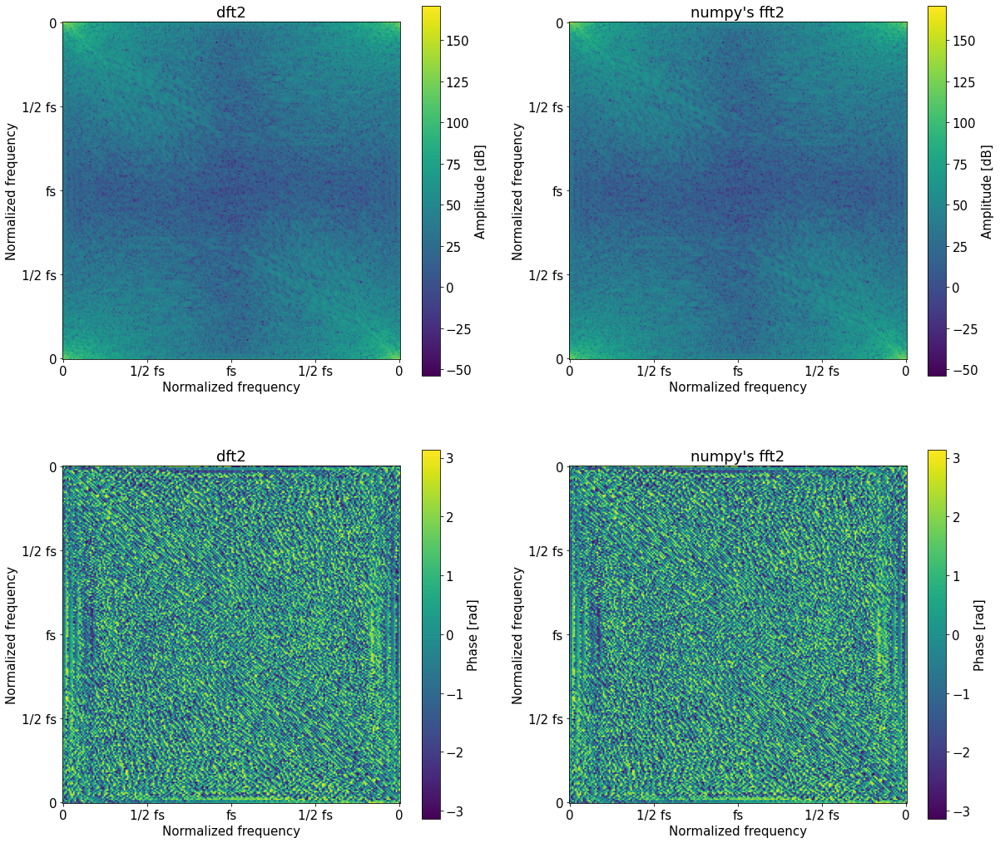

In [96]:
fftshift = False # change me

X_dft2 = dft2(img)
X_fft2 = np.fft.fft2(img)

labels = ['0', '1/2 fs', 'fs', '1/2 fs', '0']

if fftshift:
    X_dft2 = np.fft.fftshift(X_dft2)
    X_fft2 = np.fft.fftshift(X_fft2)
    labels = ['fs', '1/2 fs', '0', '1/2 fs', 'fs']
    

N_Y, N_X = img.shape

plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(18)
fig.set_figwidth(20)

im = ax[0, 0].imshow(20*np.log10(np.abs(X_dft2)**2))
ax[0, 0].set_xticks([0, (N_X-1)/4, (N_X-1)/2, 3*(N_X-1)/4, N_X-1])
ax[0, 0].set_xlabel(r'Normalized frequency')
ax[0, 0].set_xticklabels(labels)
ax[0, 0].set_yticks([0, (N_Y-1)/4, (N_Y-1)/2, 3*(N_Y-1)/4, N_Y-1])
ax[0, 0].set_ylabel('Normalized frequency')
ax[0, 0].set_yticklabels(labels)
ax[0, 0].set_title('dft2')
cbar = plt.colorbar(im, ax=ax[0, 0])
cbar.set_label('Amplitude [dB]')

im = ax[0, 1].imshow(20*np.log10(np.abs(X_fft2)**2))
ax[0, 1].set_xticks([0, (N_X-1)/4, (N_X-1)/2, 3*(N_X-1)/4, N_X-1])
ax[0, 1].set_xlabel('Normalized frequency')
ax[0, 1].set_xticklabels(labels)
ax[0, 1].set_yticks([0, (N_Y-1)/4, (N_Y-1)/2, 3*(N_Y-1)/4, N_Y-1])
ax[0, 1].set_ylabel('Normalized frequency')
ax[0, 1].set_yticklabels(labels)
ax[0, 1].set_title("numpy's fft2")
cbar = plt.colorbar(im, ax=ax[0, 1])
cbar.set_label('Amplitude [dB]')

im = ax[1, 0].imshow(np.angle(X_dft2))
ax[1, 0].set_xticks([0, (N_X-1)/4, (N_X-1)/2, 3*(N_X-1)/4, N_X-1])
ax[1, 0].set_xlabel('Normalized frequency')
ax[1, 0].set_xticklabels(labels)
ax[1, 0].set_yticks([0, (N_Y-1)/4, (N_Y-1)/2, 3*(N_Y-1)/4, N_Y-1])
ax[1, 0].set_ylabel('Normalized frequency')
ax[1, 0].set_yticklabels(labels)
ax[1, 0].set_title('dft2')
cbar = plt.colorbar(im, ax=ax[1, 0])
cbar.set_label('Phase [rad]')

im = ax[1, 1].imshow(np.angle(X_fft2))
ax[1, 1].set_xticks([0, (N_X-1)/4, (N_X-1)/2, 3*(N_X-1)/4, N_X-1])
ax[1, 1].set_xlabel('Normalized frequency')
ax[1, 1].set_xticklabels(labels)
ax[1, 1].set_yticks([0, (N_Y-1)/4, (N_Y-1)/2, 3*(N_Y-1)/4, N_Y-1])
ax[1, 1].set_ylabel('Normalized frequency')
ax[1, 1].set_yticklabels(labels)
ax[1, 1].set_title("numpy's fft2")
cbar = plt.colorbar(im, ax=ax[1, 1])
cbar.set_label('Phase [rad]')

plt.show()

## 2D FIR filter
The 2D impulse response of a FIR filter (also called a "kernel") can be obtained through an outer product, according to:
$$\large
    \mathbf{h_{2D}}[i,j] = \mathbf{p}[i]\mathbf{p}[j],
$$
where $\mathbf{h_{2D}}$ is the 2D impulse response and $\mathbf{p}$ is the impulse response of a 1D prototype filter.

Design a 2D FIR filter and place the impulse response in a variable called `h_2D`. The prototype filter impulse response should be placed in a variable called `p` and it's length in `N_p`.

In [101]:
"Your code goes below here."
N = 11
p = scipy.signal.firwin(N, 0.15, pass_zero='lowpass')
h_2D = np.zeros([N,N])
N_p = len(p)
for i in range(0,N):
    for j in range(0,N):
        h_2D[i,j] = p[i]*p[j]

### Verify your implementation
Look at the prototype filter frequency responses and at the 2D filter coefficients and it's responses. Try changing the prototype filter type, cutoff frequency, length and look at the results.

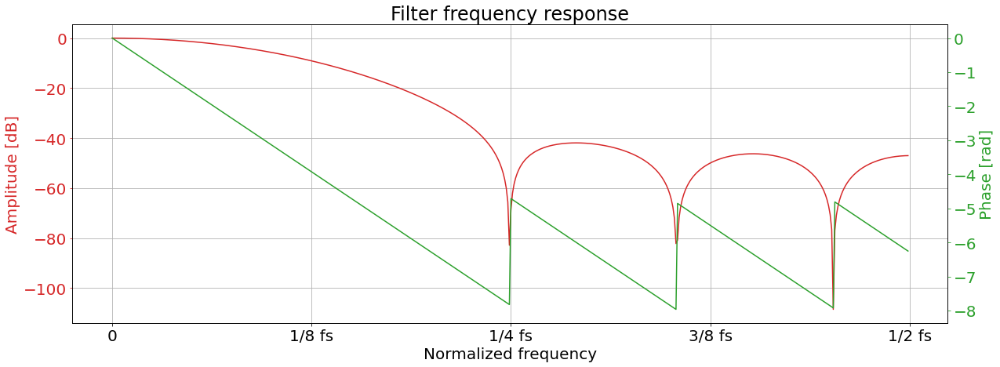

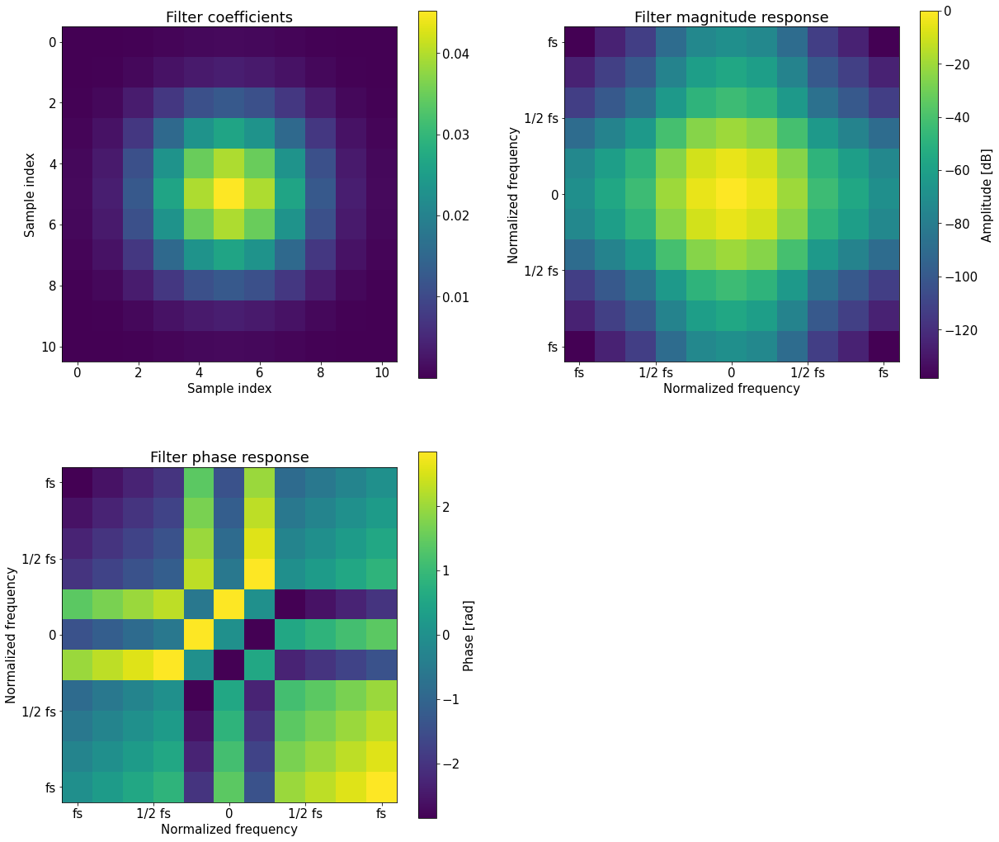

In [102]:
w, P = scipy.signal.freqz(p)
angles = np.unwrap(np.angle(P))


plt.rc('font', size=20)

fig, ax = plt.subplots(figsize=(20, 7))

ax.plot(20*np.log10(abs(P)), 'C3')
ax.grid()
ax.set_title('Filter frequency response')
ax.set_xlabel('Normalized frequency')
ax.set_ylabel('Amplitude [dB]', color='C3')
ax.set_xticks([0, len(P)/4, len(P)/2, 3*len(P)/4, len(P)])
ax.set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax.tick_params(axis='y', colors='C3')

ax2 = ax.twinx()
ax2.plot(angles, 'C2')
ax2.set_ylabel('Phase [rad]', color='C2')
ax2.tick_params(axis='y', colors='C2')

fig.show()


H_2D = np.fft.fft2(h_2D)
H_2D = np.fft.fftshift(H_2D)


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(18)
fig.set_figwidth(20)

im = ax[0, 0].imshow(h_2D)
ax[0, 0].set_xlabel('Sample index')
ax[0, 0].set_ylabel('Sample index')
ax[0, 0].set_title('Filter coefficients')
plt.colorbar(im, ax=ax[0, 0])

im = ax[0, 1].imshow(20*np.log10(np.abs(H_2D)))
ax[0, 1].set_xticks([0, (N_p-1)/4, (N_p-1)/2, 3*(N_p-1)/4, N_p-1])
ax[0, 1].set_xlabel('Normalized frequency')
ax[0, 1].set_xticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[0, 1].set_yticks([0, (N_p-1)/4, (N_p-1)/2, 3*(N_p-1)/4, N_p-1])
ax[0, 1].set_ylabel('Normalized frequency')
ax[0, 1].set_yticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[0, 1].set_title('Filter magnitude response')
cbar = plt.colorbar(im, ax=ax[0, 1])
cbar.set_label('Amplitude [dB]')

im = ax[1, 0].imshow(np.angle(H_2D))
ax[1, 0].set_xticks([0, (N_p-1)/4, (N_p-1)/2, 3*(N_p-1)/4, N_p-1])
ax[1, 0].set_xlabel('Normalized frequency')
ax[1, 0].set_xticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[1, 0].set_yticks([0, (N_p-1)/4, (N_p-1)/2, 3*(N_p-1)/4, N_p-1])
ax[1, 0].set_ylabel('Normalized frequency')
ax[1, 0].set_yticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[1, 0].set_title('Filter phase response')
cbar = plt.colorbar(im, ax=ax[1, 0])
cbar.set_label('Phase [rad]')


ax[1, 1].axis('off')

plt.show()

## Discrete 2D convolution
To apply a 2D filter to an image, we first need to understand the discrete 2D convolution, which is given by
$$\large
    \mathbf{f}[i,j] * \mathbf{g}[i,j]
    =
    \sum_{k=-\infty}^{\infty}
    \sum_{l=-\infty}^{\infty}
    \mathbf{f}[k,l]
    \mathbf{g}[i-k,j-l]
    .
$$

Let's assume a 2D impulse response $\mathbf{h_{2D}}$ and an image $\mathbf{x}$ with values as shown below.

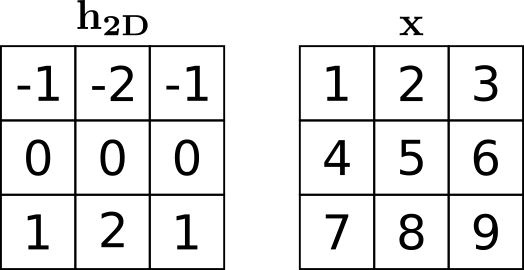

To filter the image $\mathbf{x}$ with the 2D filter impulse response $\mathbf{h_{2D}}$ we need to:
   1. Double flip the 2D impulse response matrix.

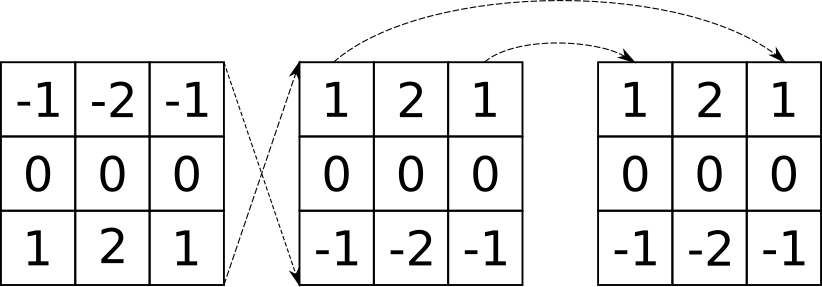

   2. Slide the kernel over the image and perform the Multiply-Accumulate (MAC) operation at each instant.

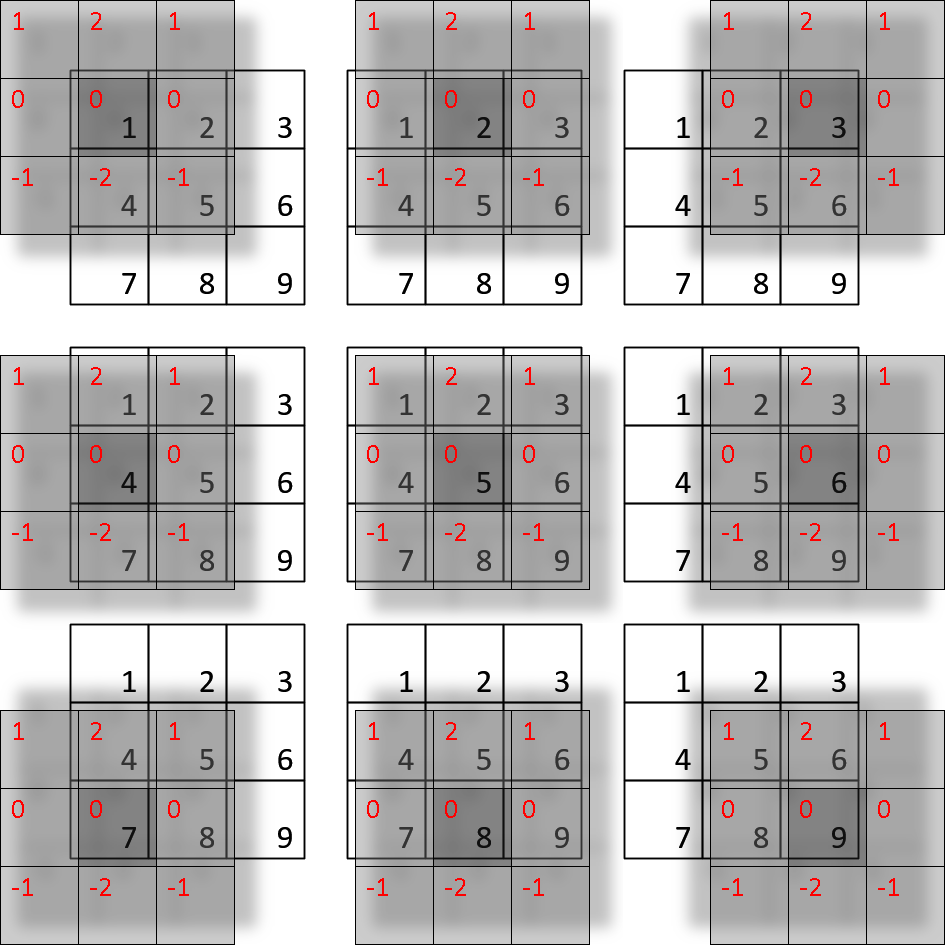

At each instant the filter coefficients are multiplied with the image values, above which they 'hover'. The reults are then summed and the final value is placed in the new image, in the same spot above which the central filter coefficitent was 'hovering'. If it is unclear, [here](http://www.songho.ca/dsp/convolution/convolution2d_example.html) is a nice example.

We are going to focus on a simplest case when the kernel is a <b>square matrix with a central value</b>, meaning that the prototype filter must have an odd number of elements.<br>
<br>
Since the image is not infinite, we are going to run out of values at the edges. There are different approaches to handle this problem:
- avoiding going over the border (results in a smaller image),
- assuming values beyond the border are equal to zero or other constant value,
- symmetrically reflecting the image along the edge,
- assuming the image is periodic.<br>

**Question**: Why do we double-flip the kernel?

**Answer**: Jest to sytuacja podobno do splotu liniowego w którym to odwracamy kolejność jądra. W tym przypadku z uwagi, iż jest to splot 2d musimy zamienić kolejnością zarówno po osi X jak i po osi Y.

Your next task is to complete the function below. It should perform the 2D convolution with zero padding.

In [103]:
def conv2(x, h):
    """
    This function performs the 2D convolution. 
    
    Parameters:
        x - An input array.
        h - 2D impulse response (kernel).
    Returns:
        y - 2D convolution of x and h.
    """  
        
    if h.shape[0] != h.shape[1]:
        raise ValueError('Kernel should be a square matrix.')
        
    elif h.shape[0]%2 == 0 or h.shape[1]%2 == 0:
        raise ValueError('Kernel should have a center (odd number or elements in rows and columns).')
        
    "Your code goes below here."

    I,J = x.shape  # wymiary obrazu
    II,JJ = h.shape # wymiary filtru
    zer_paddx = np.zeros([I+II-1,J+JJ-1])
    zer_paddx[0:I,0:J] = x # zero padding obrazu 
    new_image = np.zeros([I+II-1,J+JJ-1])  # nowy obraz
    for i in range(I+II-1):
        for j in range(J+JJ-1):
            for k in range(II):
                for l in range(JJ):
                    new_image[i,j] = new_image[i,j]+h[k,l]*zer_paddx[i-k,j-l]
    return new_image

### Verify your implementation
Now, we will compute the 2D convolution of `img` and the previously designed filter `h_2D` using your function and scipy's. See if you got the same result in the cell below. Try designing different filter `h_2D` by changing the prototype filter type, cutoff frequency, length and look at the results. The results of other approaches to image borders are also shown below.

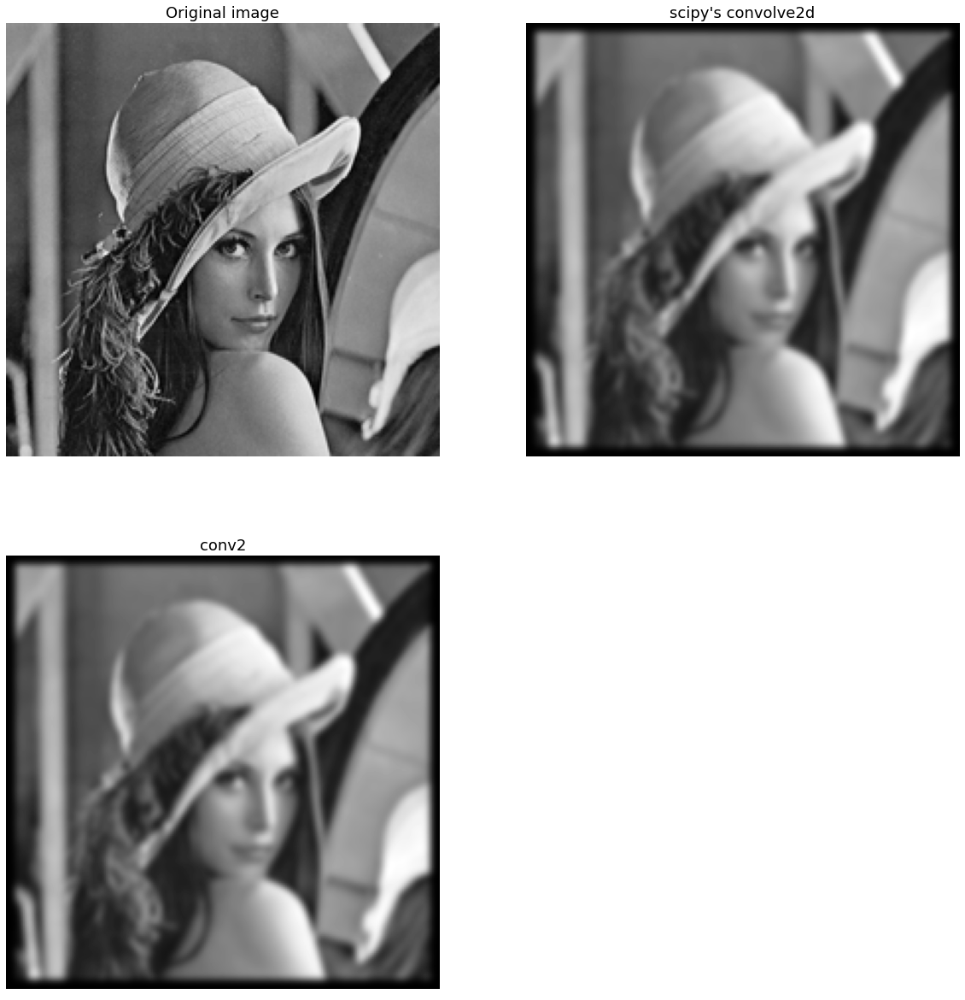

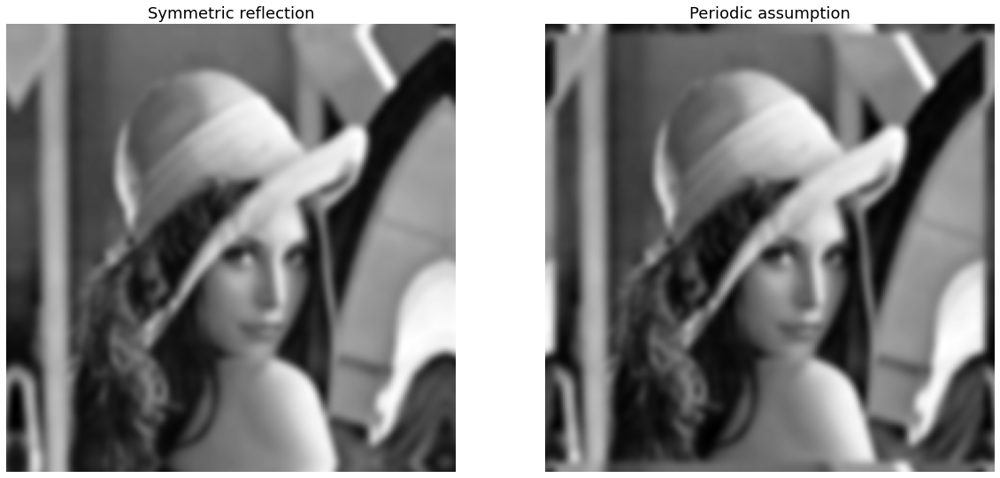

In [104]:
y_conv2 = conv2(img, h_2D)
y_scipy = scipy.signal.convolve2d(img, h_2D, mode='full', boundary='fill')

plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(21)
fig.set_figwidth(20)

ax[0, 0].imshow(img, cmap='gray')
ax[0, 0].set_title('Original image')
ax[0, 0].axis('off')

ax[0, 1].imshow(y_scipy, cmap='gray')
ax[0, 1].set_title("scipy's convolve2d")
ax[0, 1].axis('off')

ax[1, 0].imshow(y_conv2, cmap='gray')
ax[1, 0].set_title('conv2')
ax[1, 0].axis('off')

ax[1, 1].axis('off')

plt.show()


symm = scipy.signal.convolve2d(img, h_2D, mode='full', boundary='symm')
wrap = scipy.signal.convolve2d(img, h_2D, mode='full', boundary='wrap')


plt.rc('font', size=15)

fig, ax = plt.subplots(1, 2)

fig.set_figheight(14)
fig.set_figwidth(20)

ax[0].imshow(symm, cmap='gray')
ax[0].set_title('Symmetric reflection')
ax[0].axis('off')

ax[1].imshow(wrap, cmap='gray')
ax[1].set_title('Periodic assumption')
ax[1].axis('off')

plt.show()

We can specify different filters for X and Y axis simply by using appropriate prototype filters. Design a 2D FIR filter that removes low frequencies along X axis and high frequencies along Y axis. Place the impulse response in a variable called `h_2DXY`. The prototype filters impulse responses should be placed in variables called `p_X` and `p_Y`, for the X and Y axis, respetively. Keep the filter length in `N_pXY`.

In [105]:
"Your code goes below here."

N_h = 21

p_X = scipy.signal.firwin(N_h, 0.4, pass_zero='lowpass')
p_Y = scipy.signal.firwin(N_h, 0.3, pass_zero='highpass')

N_pXY = len(p_X)

h_2DXY = np.zeros([N_h,N_h])

for i in range(0,N_h):
    for j in range(0,N_h):
        h_2DXY[i,j] = p_X[i]*p_Y[j]

### Verify your implementation
Look at the prototype filters frequency responses and at the 2D filter coefficients and it's responses. This time the filtered images are cropped, so they are the same size as the original image (no additional borders). Try designing different filter `h_2DXY` by changing the prototype filters `p_X` and `p_Y` types, cutoff frequencies, lengths and look at the results.

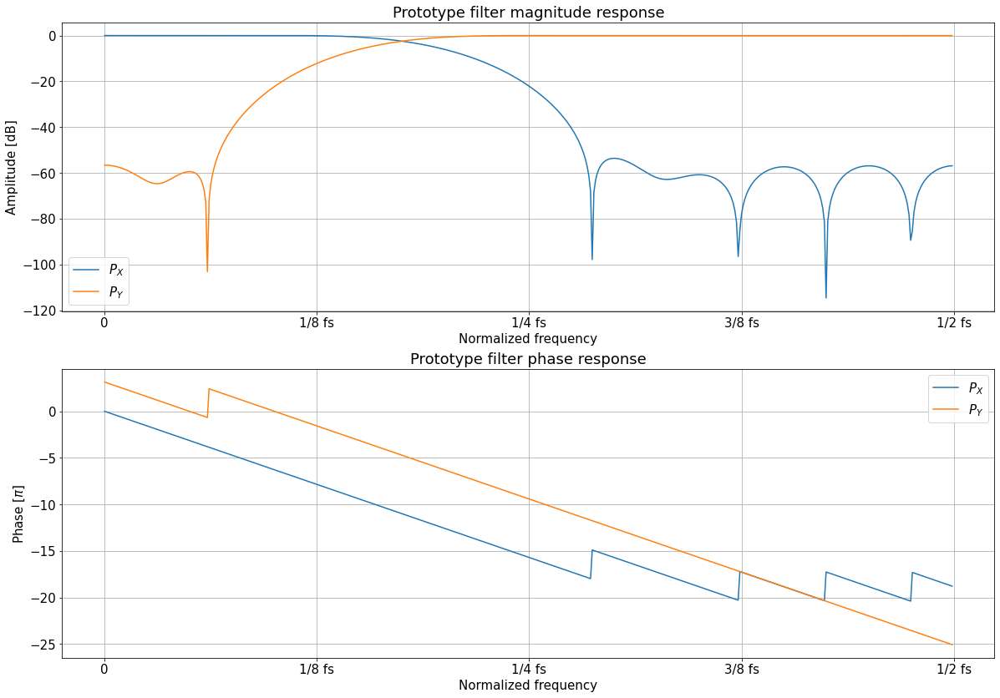

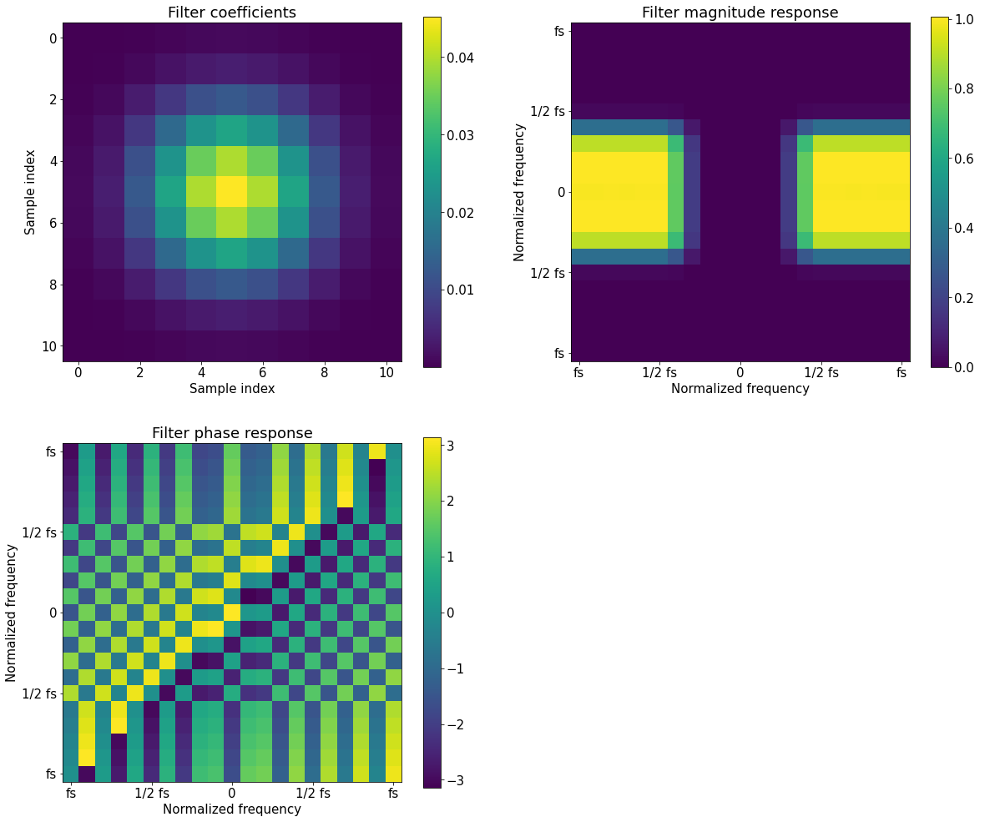

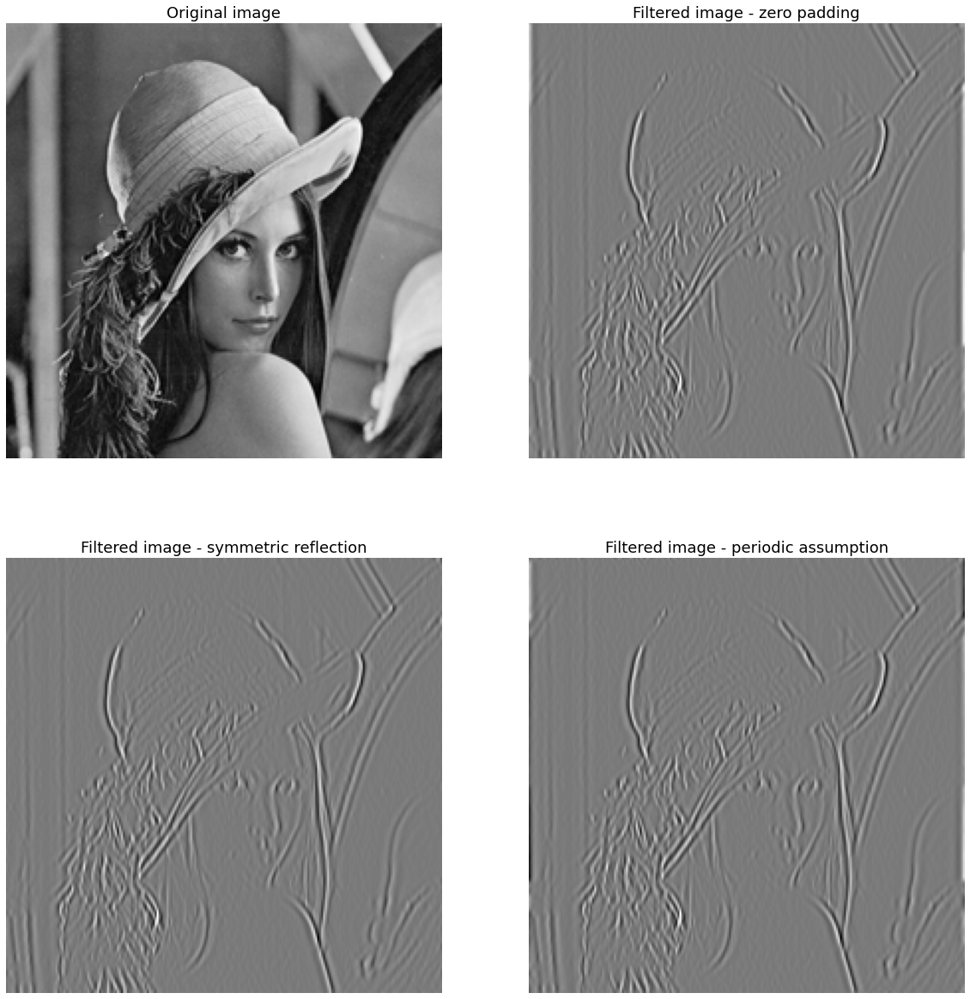

In [106]:
w_X, P_X = scipy.signal.freqz(p_X)
angles_X = np.unwrap(np.angle(P_X))

w_Y, P_Y = scipy.signal.freqz(p_Y)
angles_Y = np.unwrap(np.angle(P_Y))


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 1, figsize=(20, 14))

ax[0].plot(20*np.log10(np.abs(P_X)), label='$P_X$')
ax[0].plot(20*np.log10(np.abs(P_Y)), label='$P_Y$')
ax[0].set_title('Prototype filter magnitude response')
ax[0].set_xlabel('Normalized frequency')
ax[0].set_ylabel('Amplitude [dB]')
ax[0].set_xticks([0, len(P_X)/4, len(P_X)/2, 3*len(P_X)/4, len(P_X)])
ax[0].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[0].grid()
ax[0].legend()

ax[1].plot(angles_X, label='$P_X$')
ax[1].plot(angles_Y, label='$P_Y$')
ax[1].set_title('Prototype filter phase response')
ax[1].set_xlabel('Normalized frequency')
ax[1].set_ylabel('Phase [$\pi$]')
ax[1].set_xticks([0, len(P_Y)/4, len(P_Y)/2, 3*len(P_Y)/4, len(P_Y)])
ax[1].set_xticklabels(['0', r'1/8 fs', '1/4 fs', '3/8 fs', '1/2 fs'])
ax[1].grid()
ax[1].legend()

fig.show()


H_2D = np.fft.fft2(h_2DXY)
H_2D = np.fft.fftshift(H_2D)


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(17)
fig.set_figwidth(20)

im = ax[0, 0].imshow(h_2D)
ax[0, 0].set_xlabel('Sample index')
ax[0, 0].set_ylabel('Sample index')
ax[0, 0].set_title('Filter coefficients')
plt.colorbar(im, ax=ax[0, 0])

im = ax[0, 1].imshow(np.abs(H_2D)**2)
ax[0, 1].set_xticks([0, (N_pXY-1)/4, (N_pXY-1)/2, 3*(N_pXY-1)/4, N_pXY-1])
ax[0, 1].set_xlabel('Normalized frequency')
ax[0, 1].set_xticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[0, 1].set_yticks([0, (N_pXY-1)/4, (N_pXY-1)/2, 3*(N_pXY-1)/4, N_pXY-1])
ax[0, 1].set_ylabel('Normalized frequency')
ax[0, 1].set_yticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[0, 1].set_title('Filter magnitude response')
plt.colorbar(im, ax=ax[0, 1])

im = ax[1, 0].imshow(np.angle(H_2D))
ax[1, 0].set_xticks([0, (N_pXY-1)/4, (N_pXY-1)/2, 3*(N_pXY-1)/4, N_pXY-1])
ax[1, 0].set_xlabel('Normalized frequency')
ax[1, 0].set_xticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[1, 0].set_yticks([0, (N_pXY-1)/4, (N_pXY-1)/2, 3*(N_pXY-1)/4, N_pXY-1])
ax[1, 0].set_ylabel('Normalized frequency')
ax[1, 0].set_yticklabels(['fs', '1/2 fs', '0', '1/2 fs', 'fs'])
ax[1, 0].set_title('Filter phase response')
plt.colorbar(im, ax=ax[1, 0])

ax[1, 1].axis('off')

plt.rc('font', size=15)
plt.show()


fill = scipy.signal.convolve2d(img, h_2DXY, mode='same', boundary='fill')
symm = scipy.signal.convolve2d(img, h_2DXY, mode='same', boundary='symm')
wrap = scipy.signal.convolve2d(img, h_2DXY, mode='same', boundary='wrap')


plt.rc('font', size=15)

fig, ax = plt.subplots(2, 2)

fig.set_figheight(21)
fig.set_figwidth(20)

ax[0, 0].imshow(img, cmap='gray')
ax[0, 0].set_title('Original image')
ax[0, 0].axis('off')

ax[0, 1].imshow(fill, cmap='gray')
ax[0, 1].set_title('Filtered image - zero padding')
ax[0, 1].axis('off')

ax[1, 0].imshow(symm, cmap='gray')
ax[1, 0].set_title('Filtered image - symmetric reflection')
ax[1, 0].axis('off')

ax[1, 1].imshow(wrap, cmap='gray')
ax[1, 1].set_title('Filtered image - periodic assumption')
ax[1, 1].axis('off')

plt.show()

**Question**: How could we filter only one direction using 2D convolution, while leaving the other direction unchanged?

**Answer**: Musimy przeprowadzić operacje splotu na jednej z wybranej osi. W odpowiedzi impulsowej filtru wypełniamy jeden z kierunków osi jedynkami, przez co wynik splotu w tym kierunku nie bedzie mieć znaczenia.

# Summary

After finishing this notebook, you should have basic intuition concerning digital filters with audio signals and images. Moreover, you should understand and be able to implement 2D DFT and interpret it. You should also be able to design a 2D filter impulse response and applu it using 2D convolution.